# CHAVEZ BECERRA Cristian Alejandro

This practical work, on motion estimation, has 2 different parts, corresponding to two families of algorithms that we have seen in class:
- Block matching algorithms
- Optic flow

You are asked to complete the different algorithms and to try it. Also, please answer to the theoretical questions, in the notebook.

In [46]:
import numpy as np
from scipy.io import loadmat
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import gaussian_filter
from scipy.interpolate import griddata
from scipy.signal import convolve2d

# I - Block matching algorithms
## I-1 - Unregularized algorithms
### I-1-a - Unregularized SSD-based algorithm

First, read the two images 'flower_cif_1.mat' and 'flower_cif_1.mat', which are two consecutive frames of a video sequence. You will have to estimate the motion between these frame, using block matching algorithms.

In [47]:
im1 = loadmat('flower_cif_1.mat')['im1']
im1 = im1.astype('float')
im2 = loadmat('flower_cif_2.mat')['im2']
im2 = im2.astype('float')

(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x1e168401ca0>)

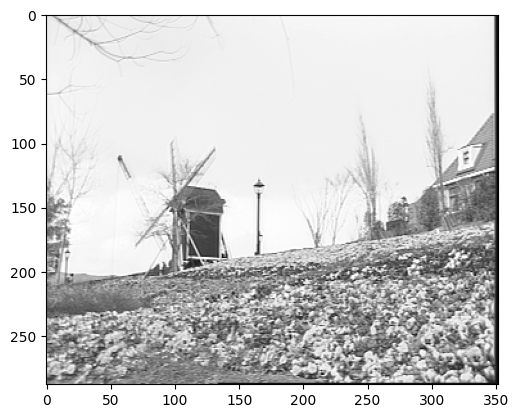

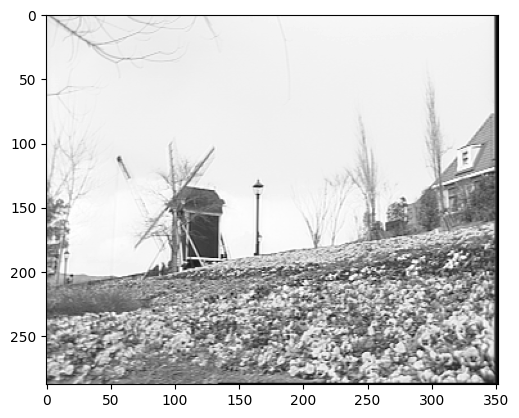

In [48]:
plt.figure(),plt.imshow(im1,cmap='gray')
plt.figure(),plt.imshow(im2,cmap='gray')

First, you will have to encode a block matching using the SSD criterion. Some default values of the algorithm are given below: the number of column and rows in each block, and the search radius.

In [49]:
brow = 16 # Number of rows per block
bcol = 16 # Number of columns per block
search_radius = 8 # Search radius

Fill the me_ssd function in the cell below. First, implement the unregularized part of the function (you will implement the regularized one later). Do not pay attention to the computePredictor and initVector (we will speak about them later on).

In [50]:
#%%
def initVector(ref,cur):
    """
    Performs an initialization for the first regularizers

    Parameters
    ----------
    ref : np.array
        Reference image.
    cur : np.array
        current image.

    Returns
    -------
    pV : np.array (vector of size 2)
        Regularizer for displacement.

    """
    
    
    step = 8
    cont = 4*step
    
    REF = gaussian_filter(ref,1.) # Unclear how to set sigma
    CUR = gaussian_filter(cur,1.)
    
    CUR = CUR[cont+1:(np.shape(CUR)[0]-cont):step,cont+1:(np.shape(CUR)[1]-cont):step]
    SSDMIN = np.inf
    
    pV=np.zeros(2)
    
    for globR in range(-cont,cont):
        for globC in range(-cont,cont):
            RR = REF[cont+1-globR:(cont-globR+np.shape(CUR)[0]*step):step, cont+1-globC:(cont-globC+np.shape(CUR)[1]*step):step]
            SSD = np.sum((RR-CUR)**2)
            
            if SSD<SSDMIN:
                SSDMIN=SSD
                pV[0]=globR
                pV[1]=globC
                
                
    return pV

#%%
def computePredictor(r,c,brow,bcol,mvf,ref,cur):
    """
    compute predictor gives the median of the mvf of the blocks :
        - to the left of the current block
        - above the current block
        - upper left of the current block
        
    If such blocks do not exist due to the border effects, they are not taken into account.

    Parameters
    ----------
    See usage in the me_ssd function

    Returns
    -------
    pV : Median of the mvf of the neighboor blocks

    """
    if r < brow and c < bcol:
        pV = initVector(ref,cur)
        
    elif r < brow: # First row
        pV = mvf[r,c-bcol,:]
        
    elif c < bcol: # First column
        pV = mvf[r-brow,c,:]
        
    else: # Inside
        if c >= np.shape(mvf)[1]-bcol: # Last column
            vC = mvf[r-brow,c-bcol,:]
        
        else: # Not the last column
            vC = mvf[r-brow,c+bcol,:]
            
        vA = mvf[r,c-bcol,:]
        vB = mvf[r-brow,c,:]

        temp = np.array([vA, vB, vC]).T

        pV = np.median(temp,axis = 1)
        
    pV = pV.ravel()
    
    return pV


#%%
def me_ssd(cur, ref, brow, bcol, search, lamb=0):
    """
    ME BMA full search Motion estimation
    mvf, prediction = me_ssd(cur, ref, brow, bcol, search);

    A regularization constraint can be used
    mvf = me(cur, ref, brow, bcol, search, lambda);
    In this case the function minimize SAD(v)+lambda*error(v)
    where error(v) is the difference between the candidate vector v and the
    median of its avalaible neighbors.
 
    Code inspired from the one of Marco Cagnazzo


    Parameters
    ----------
    cur : numpy array
        Current (i.e. second) frame of the video.
    ref : numpy array
        Previous (i.e. first) frame of the video.
    brow : int
        Number of rows in each block.
    bcol : int
        Number of rows in each block.
    search : int
        Search radius
    lamb : double
        Regularization parameter

    Returns
    -------
    mvf : TYPE
        DESCRIPTION.
    prediction : TYPE
        DESCRIPTION.

    """
    search_radius = search    
    extension = search
    
    ref_extended = cv2.copyMakeBorder(ref, extension, extension, extension, extension, cv2.BORDER_REPLICATE) # To avoid border effect
    
    prediction = np.zeros(np.shape(cur));
    lamb *= brow*bcol;
    
    mvf = np.zeros((np.shape(cur)[0],np.shape(cur)[1],2))
    
    # Non-regularized search
    if lamb == 0.:
#Aquí vamos a primero iterar bloque por bloque de la current image
        for r in range(0, cur.shape[0], brow):
            for c in range(0, cur.shape[1], bcol):
                # current block selection
                B = cur[r:r+brow, c:c+bcol]

                # Initialization:
                costMin = float('inf')
                Rbest = np.zeros((brow, bcol))
                mv = [0, 0]
                
                # Loop on candidate displacement vectors
                for dcol in range(-search_radius, search_radius+1):
                    for drow in range(-search_radius, search_radius+1):
                        # Extract the candidate block from the extended reference frame
                        R = ref_extended[r+drow+extension:r+drow+extension+brow, c+dcol+extension:c+dcol+extension+bcol]
                        
                        # Calculate SSD
                        ssd = np.sum((B - R) ** 2)
                        
                        # Save the results if they are better than the previous ones
                        if ssd < costMin:
                            costMin = ssd
                            Rbest = R
                            mv = [drow,dcol]
                
                mvf[r:r+brow, c:c+bcol, 0] = mv[0] # Save the best row displacement field
                mvf[r:r+brow, c:c+bcol, 1] = mv[1] # Save the best column displacement field
                prediction[r:r+brow, c:c+bcol] = Rbest
    else: # Regularized search
        for r in range(0, cur.shape[0], brow):
            for c in range(0, cur.shape[1], bcol):
                # current block selection
                B = cur[r:r+brow, c:c+bcol]
    
                # Initializations
                costMin = float('inf')
                Rbest = np.zeros((brow, bcol))
                mv = [0, 0]
    
                # Neighbours : pV is the regularization vector. The regularizer must be such that the estimated displacement is not too far away from pV
                pV = computePredictor(r, c, brow, bcol, mvf, ref, cur)
    
                # Loop on candidate vectors
                for dcol in range(-search_radius, search_radius+1):
                    for drow in range(-search_radius, search_radius+1):
                        # Extract the candidate block from the extended reference frame
                        R = ref_extended[r+drow+extension:r+drow+extension+brow, c+dcol+extension:c+dcol+extension+bcol]
    
                        # Calculate regularized cost
                        cost = np.sum((B - R) ** 2) + lamb * np.sum(([drow, dcol] - pV) ** 2)
    
                        # Save the results if they are better than the previous ones
                        if cost < costMin:
                            costMin = cost
                            Rbest = R
                            mv = [drow, dcol]
    
                mvf[r:r+brow, c:c+bcol, 0] = mv[0] # Save the best row displacement field
                mvf[r:r+brow, c:c+bcol, 1] = mv[1] # Save the best column displacement field                
                    
    mvf = -mvf # For compatibility with standards
                            
    return mvf, prediction

In [51]:
mvf_ssd,prediction =  me_ssd(im2, im1, brow, bcol, search_radius)

Using the function displayMVF, show the motion vector field. Write your remarks. Are there errors? If yes, where and why?

Change the block size and the search area radius. How does it impact your results?

In [52]:
def displayMVF(I,mvf,subsamp):
    
    row,col = np.shape(I)
    
    # Subsample dense MVF 
    vectRow = mvf[0:row:subsamp,0:col:subsamp,0]
    vectCol = mvf[0:row:subsamp,0:col:subsamp,1]
    
    # Determine vector origins
    X,Y = np.meshgrid(np.arange(0,col,subsamp),np.arange(0,row,subsamp))	
    X = X + np.floor(subsamp/2.)
    Y = Y + np.floor(subsamp/2.)
    
    # Show image
    plt.figure()
    plt.imshow(I,cmap='gray')

    plt.quiver(X, Y, vectCol,-vectRow)

    
    return

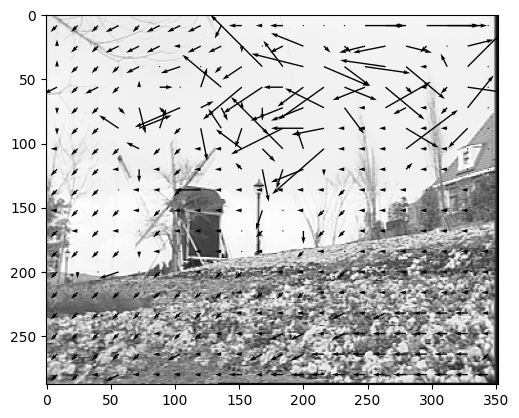

In [53]:
displayMVF(im1,mvf_ssd,brow)

We can appreciate errors in the sky for example, where we know a priori that there is not considerable movement between the 2 images, but the algorithm take it like that because it find really similar values in the sky in different positions since the sky in this case has uniform color. And since the algorithm does not penalize big changes in the for movement vector, it may take such big values for it

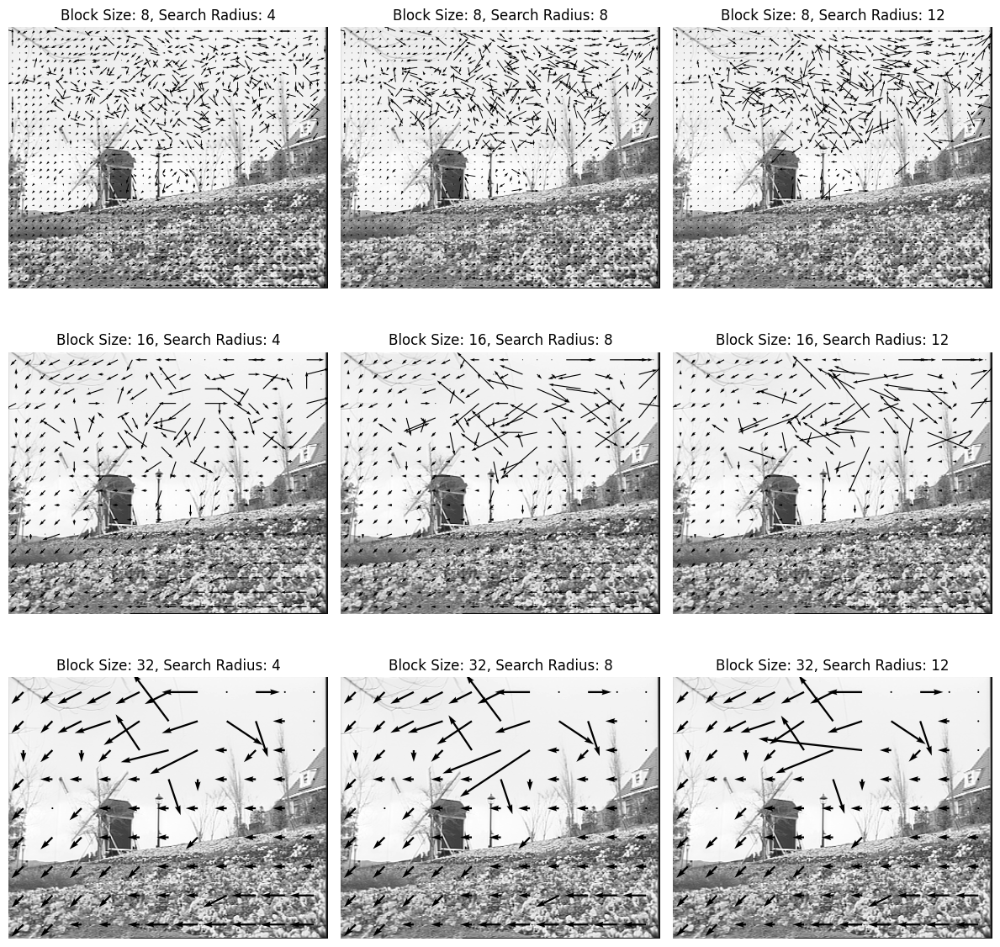

In [54]:
block_sizes = [8, 16, 32]  # List of block sizes to iterate over
search_radii = [4, 8, 12]  # List of search radii to iterate over

fig, axs = plt.subplots(len(block_sizes), len(search_radii), figsize=(12, 12))

row,col = np.shape(im1)
for i, block_size in enumerate(block_sizes):
	for j, search_radius in enumerate(search_radii):
		mvf, prediction = me_ssd(im2, im1, block_size, block_size, search_radius)
		subsamp = 4  # Subsampling factor for dense MVF display

		vectRow = mvf[0:row:block_size, 0:col:block_size, 0]
		vectCol = mvf[0:row:block_size, 0:col:block_size, 1]

		# Determine vector origins
		X, Y = np.meshgrid(np.arange(0, im1.shape[1], block_size), np.arange(0, im1.shape[0], block_size))
		X = X + np.floor(block_size / 2.)
		Y = Y + np.floor(block_size / 2.)

		# Show image
		axs[i, j].imshow(im1, cmap='gray')

		axs[i, j].quiver(X, Y, vectCol, -vectRow)
		axs[i, j].set_title(f"Block Size: {block_size}, Search Radius: {search_radius}")
		axs[i, j].axis('off')

plt.tight_layout()
plt.show()


The bigger the search radious, the bigger the error may be since the sky has a uniform color then wrong movement vector may point now to a even more away distance. The bigger the block size the less the amount of wron vectors since there are less vectors due to the block size is bigger but the image keeps the same size, but it may lead to unaccurate changes in other words less precision

Motion compensation: now that we have computed the movement vector field, we can compute the motion compensated image using the fracMc function. Display the motion compensated image. What can you observe ?

In [55]:
def fracMc(ref,mvf,outofbound=20):
    
    [rows, cols] = np.shape(ref);
    
    
    
    mc_c, mc_r = np.meshgrid(np.arange(cols),np.arange(rows)) # Initial coordinates, used to infer the new coordinates
    
    mc_r_tmp = mc_r + mvf[:,:,0] # Row coordinates, after the movement
    mc_c_tmp = mc_c + mvf[:,:,1] # Column coordinates, after the movement
    
    extension = outofbound
    #ref = cv2.copyMakeBorder(ref, extension, extension, extension, extension, cv2.BORDER_REPLICATE)# Padded image
    ref = cv2.copyMakeBorder(ref, extension, extension, extension, extension, cv2.BORDER_REFLECT)# Padded image
    
    mc_r = mc_r_tmp + extension # Row coordinates, after the movement, in which we want to do the interpolation (in the padded image)
    mc_c = mc_c_tmp + extension # Column coordinates, after the movement, in which we want to do the interpolation (in the padded image)
    
    colMeshGrid, rowMeshGrid = np.meshgrid(np.arange(cols+2*extension),np.arange(rows+2*extension)) # Original coordinates, at which we know the data points
    
    
    # Put the input coordinates into the form of an array, to mach scipy format
    points = np.zeros((np.shape(ref)[0]*np.shape(ref)[1],2))
    points[:,0] = colMeshGrid.reshape(np.shape(ref)[0]*np.shape(ref)[1])
    points[:,1] = rowMeshGrid.reshape(np.shape(ref)[0]*np.shape(ref)[1])
    
    values = ref.reshape(np.shape(ref)[0]*np.shape(ref)[1])    
    
    
    # Put the coordinates in which we want ot do the interpolation into the form of an array, to mach scipy format
    points_inter = np.zeros((rows*cols,2))
    points_inter[:,0] = mc_c.reshape(rows*cols)
    points_inter[:,1] = mc_r.reshape(rows*cols)
    
    motcomp =  griddata(points, values, points_inter,'linear')
    
    motcomp = motcomp.reshape(rows,cols)

    return motcomp

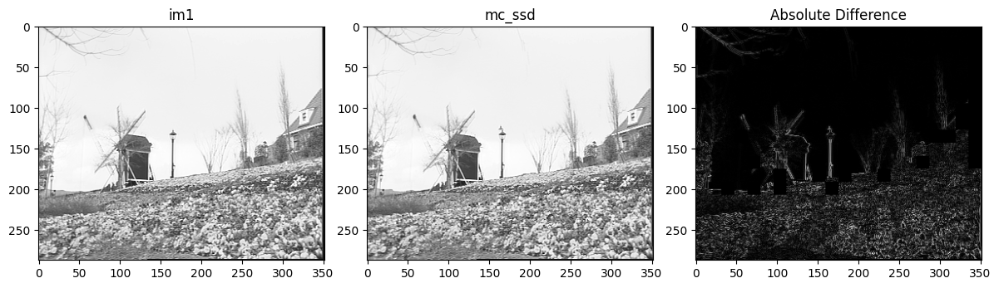

In [56]:
mc_ssd = fracMc(im1,mvf_ssd)
plt.figure(figsize=(12, 4))

plt.subplot(131)
plt.imshow(im1, cmap='gray')
plt.title('im1')

plt.subplot(132)
plt.imshow(mc_ssd, cmap='gray')
plt.title('mc_ssd')

plt.subplot(133)
diff = np.abs(im1 - mc_ssd)
plt.imshow(diff, cmap='gray')
plt.title('Absolute Difference')

plt.tight_layout()
plt.show()
#plt.figure(),plt.imshow(mc_ssd,cmap='gray')

We can appreciate that contours, in general, move but the biggest error is on the top of the lamp where it seems that block mooved entirely to the left-upper diagonal, also, we can see less quality appreciating the flowers that now seem more blurred

Compute the PSNR between the motion compensated and the current images.

Recall the definition of PSNR. Code the PSNR function. Compute it using the BM algorithm results, with different parameter values. Explain what you observe.

Is the PSNR between the motion-compensated image and im2 better than between im1 and im2 ? Explain why.

In [57]:
def PSNR(im1, im2):
    """
    Computes the PSNR between im1 and im2. The two images must have the same size.

    Parameters
    ----------
    im1, im2 : nparray
        Two images.

    Returns
    -------
    psnr : float
    """
    ...
    #calculating mse
    mse = np.mean((im1 - im2) ** 2)
	#maximum possible pixel value of the image
    max_pixel = np.max(im1)
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr


PSNR (Peak Signal-to-Noise Ratio) is a metric commonly used to evaluate the quality of reconstructed or compressed images. It measures the ratio between the maximum possible power of a signal and the power of corrupting noise that affects the fidelity of its representation. PSNR is often expressed in decibels (dB) and is calculated using the mean squared error (MSE) between the original and reconstructed images.

The formula for PSNR is given by:

$$
\text{PSNR} = 20 \cdot \log_{10}\left(\frac{{\text{MAX}}}{{\sqrt{\text{MSE}}}}\right)
$$

Where:

$$
\text{MSE} = \frac{1}{N} \sum_{i=1}^{N} (I(i) - K(i))^2
$$


- $ \text{PSNR} $ is the Peak Signal-to-Noise Ratio.
- $ \text{MAX} $ is the maximum possible pixel value.
- $ \text{MSE} $ is the Mean Squared Error.
- $ I(i) $ and $ K(i) $ represent pixel intensities of the original and reconstructed images.
- $ N $ is the total number of pixels.


In [58]:

# Define the different block sizes and search radii to test
block_sizes = [8, 16, 32]
search_radii = [8, 16]

# Iterate over the block sizes and search radii
for block_size in block_sizes:
    for search_radius in search_radii:
        # Call the me_ssd method with the current block size and search radius
        mvf_ssd, pred = me_ssd(im2, im1, block_size, block_size, search_radius)
        mc_ssdtemp = fracMc(im1,mvf_ssd)
        # Compute the PSNR for the current result
        psnr_ssd = PSNR(im2, mc_ssdtemp)
        
        # Print the PSNR value
        print(f"Block Size: {block_size}, Search Radius: {search_radius}, PSNR: {psnr_ssd} dB")
print(f'PSNR for im1 and im2 = {PSNR(im2, im1):.2f} dB')

Block Size: 8, Search Radius: 8, PSNR: 16.411388922595744 dB
Block Size: 8, Search Radius: 16, PSNR: 16.117943005723326 dB
Block Size: 16, Search Radius: 8, PSNR: 16.460076383673186 dB
Block Size: 16, Search Radius: 16, PSNR: 16.458704686485987 dB
Block Size: 32, Search Radius: 8, PSNR: 16.347554902995817 dB
Block Size: 32, Search Radius: 16, PSNR: 16.347552970880223 dB
PSNR for im1 and im2 = 18.79 dB


Even though im1 and im2 are different images, they are closer than the approximations we're creating using the movement vector field approach using the ssd since it leads to big errors as notices in the comparison regardless of the block size and search radious.

Even if changing the block size and search radious may lead to some improvement of the psnr, it's not big enough to be considered as helpful

### I-1-b Unregularized SAD-based algorithm
Now, we will use the SAD as a metric for the block matching algorithm. To do that, implement the unregularized part of the me_sad algorithm. Please note that you function should be very similar to me_ssd, except for the metric (as such, as a starting point, you can copy paste what you have proposed for me_ssd).

In [59]:
def computePredictor(r,c,brow,bcol,mvf,ref,cur):
    """
    compute predictor gives the median of the mvf of the blocks :
        - to the left of the current block
        - above the current block
        - upper left of the current block
        
    If such blocks do not exist due to the border effects, they are not taken into account.

    Parameters
    ----------
    See usage in the me_ssd function

    Returns
    -------
    pV : Median of the mvf of the neighboor blocks

    """
    if r < brow and c < bcol:
        pV = initVector(ref,cur)
        
    elif r < brow: # First row
        pV = mvf[r,c-bcol,:]
        
    elif c < bcol: # First column
        pV = mvf[r-brow,c,:]
        
    else: # Inside
        if c >= np.shape(mvf)[1]-bcol: # Last column
            vC = mvf[r-brow,c-bcol,:]
        
        else: # Not the last column
            vC = mvf[r-brow,c+bcol,:]
            
        vA = mvf[r,c-bcol,:]
        vB = mvf[r-brow,c,:]

        temp = np.array([vA, vB, vC]).T

        pV = np.median(temp,axis = 1)
        
    pV = pV.ravel()
    
    return pV

#%%
def initVector(ref,cur):
    """
    Performs an initialization for the first regularizers

    Parameters
    ----------
    ref : np.array
        Reference image.
    cur : np.array
        Reference image.

    Returns
    -------
    pV : np.array (vector of size 2)
        Regularizer for displacement.

    """
    
    
    step = 8
    cont = 4*step
    
    REF = gaussian_filter(ref,1.) # Unclear how to set sigma
    CUR = gaussian_filter(cur,1.)
    
    CUR = CUR[cont+1:(np.shape(CUR)[0]-cont):step,cont+1:(np.shape(CUR)[1]-cont):step]
    SSDMIN = np.inf
    
    pV=np.zeros(2)
    
    for globR in range(-cont,cont):
        for globC in range(-cont,cont):
            RR = REF[cont+1-globR:(cont-globR+np.shape(CUR)[0]*step):step, cont+1-globC:(cont-globC+np.shape(CUR)[1]*step):step]
            SSD = np.sum((RR-CUR)**2)
            
            if SSD<SSDMIN:
                SSDMIN=SSD
                pV[0]=globR
                pV[1]=globC
                
                
    return pV
#%%
def me_sad(cur, ref, brow, bcol, search, lamb=0):
    """
    ME BMA full search Motion estimation
    mvf, prediction = me_ssd(cur, ref, brow, bcol, search);

    A regularization constraint can be used
    mvf = me(cur, ref, brow, bcol, search, lambda);
    In this case the function minimize SAD(v)+lambda*error(v)
    where error(v) is the difference between the candidate vector v and the
    median of its avalaible neighbors.
 
    Code inspired from the one of Marco Cagnazzo


    Parameters
    ----------
    cur : numpy array
        Current (i.e. second) frame of the video.
    ref : numpy array
        Previous (i.e. first) frame of the video.
    brow : int
        Number of rows in each block.
    bcol : int
        Number of rows in each block.
    search : int
        Search radius
    lamb : double
        Regularization parameter

    Returns
    -------
    mvf : TYPE
        DESCRIPTION.
    prediction : TYPE
        DESCRIPTION.

    """
    search_radius = search
    extension = search
    
    ref_extended = cv2.copyMakeBorder(ref, extension, extension, extension, extension, cv2.BORDER_REPLICATE)
    
    prediction = np.zeros(np.shape(cur));
    lamb *= brow*bcol;
    
    mvf = np.zeros((np.shape(cur)[0],np.shape(cur)[1],2))
    
    # Non-regularized search
    if lamb == 0.:
        for r in range(0, cur.shape[0], brow):
            for c in range(0, cur.shape[1], bcol):
                # current block selection
                B = cur[r:r+brow, c:c+bcol]

                # Initialization:
                costMin = float('inf')
                Rbest = np.zeros((brow, bcol))
                mv = [0, 0]
                
                # Loop on candidate displacement vectors
                for dcol in range(-search_radius, search_radius+1):
                    for drow in range(-search_radius, search_radius+1):
                        # Extract the candidate block from the extended reference frame
                        R = ref_extended[r+drow+extension:r+drow+extension+brow, c+dcol+extension:c+dcol+extension+bcol]
          
                        # Calculate SSD
                        sad = np.sum(np.abs(B - R))
                        
                        # Save the results if they are better than the previous ones
                        if sad < costMin:
                            costMin = sad
                            Rbest = R
                            mv = [drow,dcol]
                
                mvf[r:r+brow, c:c+bcol, 0] = mv[0] # Save the best row displacement field
                mvf[r:r+brow, c:c+bcol, 1] = mv[1] # Save the best column displacement field
                prediction[r:r+brow, c:c+bcol] = Rbest
                
    else: # Regularized search
        for r in range(0, cur.shape[0], brow):
            for c in range(0, cur.shape[1], bcol):
                # current block selection
                B = cur[r:r+brow, c:c+bcol]
    
                # Initializations
                costMin = float('inf')
                Rbest = np.zeros((brow, bcol))
                mv = [0, 0]
    
                # Neighbours : pV is the regularization vector. The regularizer must be such that the estimated displacement is not too far away from pV
                pV = computePredictor(r, c, brow, bcol, mvf, ref, cur)
    
                # Loop on candidate vectors
                for dcol in range(-search_radius, search_radius+1):
                    for drow in range(-search_radius, search_radius+1):
                        # Extract the candidate block from the extended reference frame
                        R = ref_extended[r+drow+extension:r+drow+extension+brow, c+dcol+extension:c+dcol+extension+bcol]
    
                        # Calculate regularized cost
                        cost = np.sum(np.abs(B - R)) + lamb * np.sum(np.abs([drow, dcol] - pV))
    
                        # Save the results if they are better than the previous ones
                        if cost < costMin:
                            costMin = cost
                            Rbest = R
                            mv = [drow, dcol]
    
                mvf[r:r+brow, c:c+bcol, 0] = mv[0] # Save the best row displacement field
                mvf[r:r+brow, c:c+bcol, 1] = mv[1] # Save the best column displacement field                
                prediction[r:r+brow, c:c+bcol] = Rbest
                
    mvf = -mvf # For compatibility with standards
                            
    return mvf, prediction

In [60]:
brow = 16 # Number of rows per block
bcol = 16 # Number of columns per block
search_radius = 8 # Search radius

In [61]:
mvf_sad,prediction =  me_sad(im2, im1, brow, bcol, search_radius)
mvf_ssd,prediction =  me_ssd(im2, im1, brow, bcol, search_radius)

Show the motion vector field using the displayMVF function. Do you see any difference with the SSD ? Explain.

16


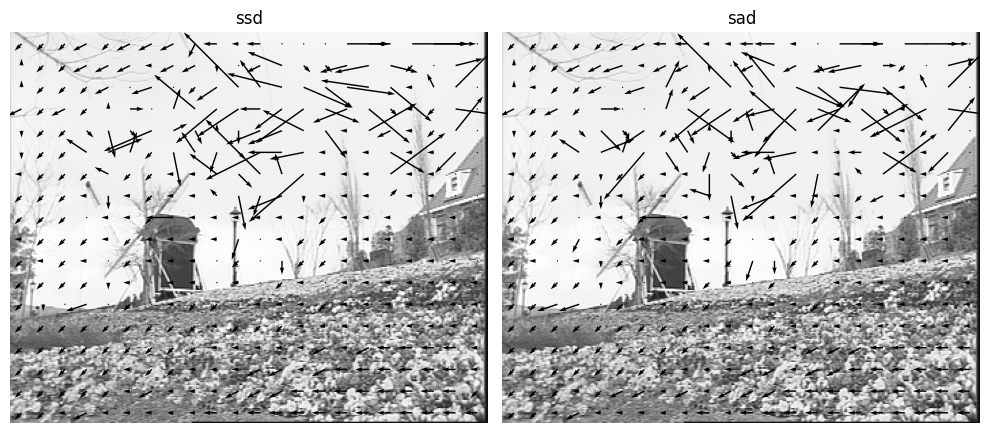

In [62]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
print(brow)
row, col = np.shape(im1)
for i in range(2):
	if i == 0:
		mvf = mvf_ssd
	else:
		mvf = mvf_sad

	vectRow = mvf[0:row:brow, 0:col:brow, 0]
	vectCol = mvf[0:row:brow, 0:col:brow, 1]

	# Determine vector origins
	X, Y = np.meshgrid(np.arange(0, im1.shape[1], brow), np.arange(0, im1.shape[0], brow))
	X = X + np.floor(brow / 2.)
	Y = Y + np.floor(brow / 2.)

	# Show image
	axs[i].imshow(im1, cmap='gray')

	axs[i].quiver(X, Y, vectCol, -vectRow)
	if i == 0:
		axs[i].set_title(f"ssd")
	else:
		axs[i].set_title(f"sad")
	axs[i].axis('off')

plt.tight_layout()
plt.show()


Even though ssd and sad have pretty much the same errors, since SSD emphasizes large differences between pixel intensities more than small differences because it squares the differences we can appreciate that the errors of sad are bigger most of the time

Motion compensation: compute the motion compensated image and display it. In addition, compute the PSNR.

Comment the difference observed between SSD and SAD in terms of regularity of the motion vector field, PSNR of the prediction and impact of the block size.

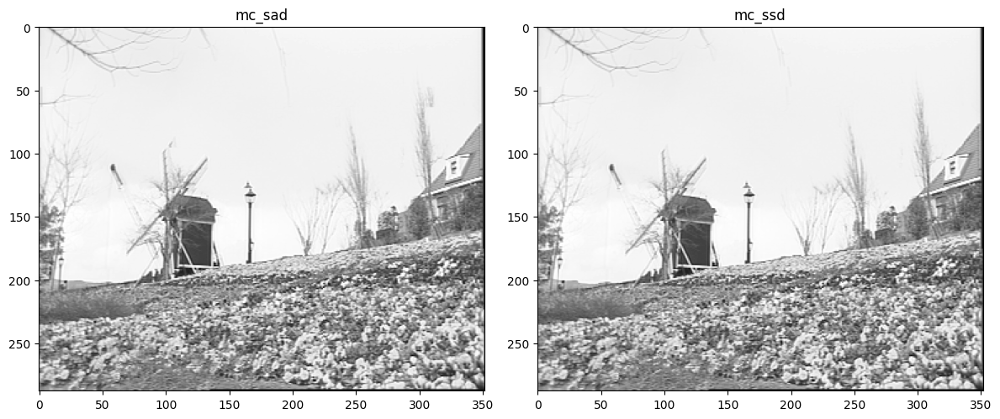

In [63]:
mc_sad = fracMc(im1,mvf_sad)
# Plot mc_sad
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(mc_sad, cmap='gray')
plt.title('mc_sad')

# Plot mc_ssd
plt.subplot(1, 2, 2)
plt.imshow(mc_ssd, cmap='gray')
plt.title('mc_ssd')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


We can see that in the SAD apparoach there are bigger differences in the mill sails and the right tree's branches

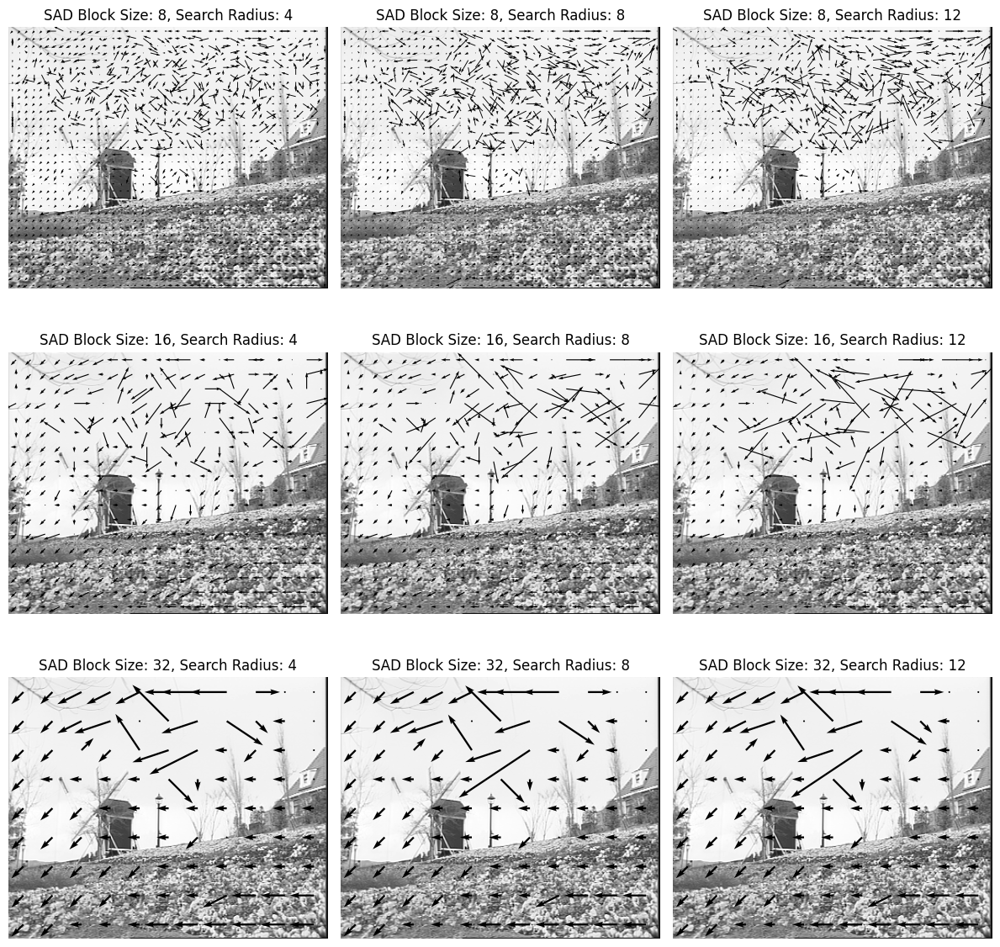

In [64]:
block_sizes = [8, 16, 32]  # List of block sizes to iterate over
search_radii = [4, 8, 12]  # List of search radii to iterate over

fig, axs = plt.subplots(len(block_sizes), len(search_radii), figsize=(12, 12))

row,col = np.shape(im1)
for i, block_size in enumerate(block_sizes):
	for j, search_radius in enumerate(search_radii):
		mvf, prediction = me_sad(im2, im1, block_size, block_size, search_radius)
		subsamp = 4  # Subsampling factor for dense MVF display

		vectRow = mvf[0:row:block_size, 0:col:block_size, 0]
		vectCol = mvf[0:row:block_size, 0:col:block_size, 1]

		# Determine vector origins
		X, Y = np.meshgrid(np.arange(0, im1.shape[1], block_size), np.arange(0, im1.shape[0], block_size))
		X = X + np.floor(block_size / 2.)
		Y = Y + np.floor(block_size / 2.)

		# Show image
		axs[i, j].imshow(im1, cmap='gray')

		axs[i, j].quiver(X, Y, vectCol, -vectRow)
		axs[i, j].set_title(f"SAD Block Size: {block_size}, Search Radius: {search_radius}")
		axs[i, j].axis('off')

plt.tight_layout()
plt.show()


The effect of the change in the block size and the search radius in SAD is pretty much the same as in SSD: The bigger the search radious, the bigger the error may be since the sky has a uniform color then wrong movement vector may point now to a even more away distance. The bigger the block size the less the amount of wron vectors since there are less vectors due to the block size is bigger but the image keeps the same size, but it may lead to unaccurate changes in other words less precision

In [65]:
psnr_sad = PSNR(im2,mc_sad)
print(psnr_sad)

16.39962998394595


The psnr value of SAD is a little bit worse than in SSD which make sense due to the errors in the mill sails and the right tree's branches that we remarked before

## I-2- Regularized algorithms
Now, we will add a regularization term to the metrics (SSD and then SAD) we previously used.
### I-2-1- Regularized SSD-based algorithm

TO DO : code the regularized SSD-based algorithm.
For the sake of simplicity, the regularizing function is already given. How does it work and what does it compute?

Try several parameter values, and compare your results with the unregularized algorithms. What can you observe?

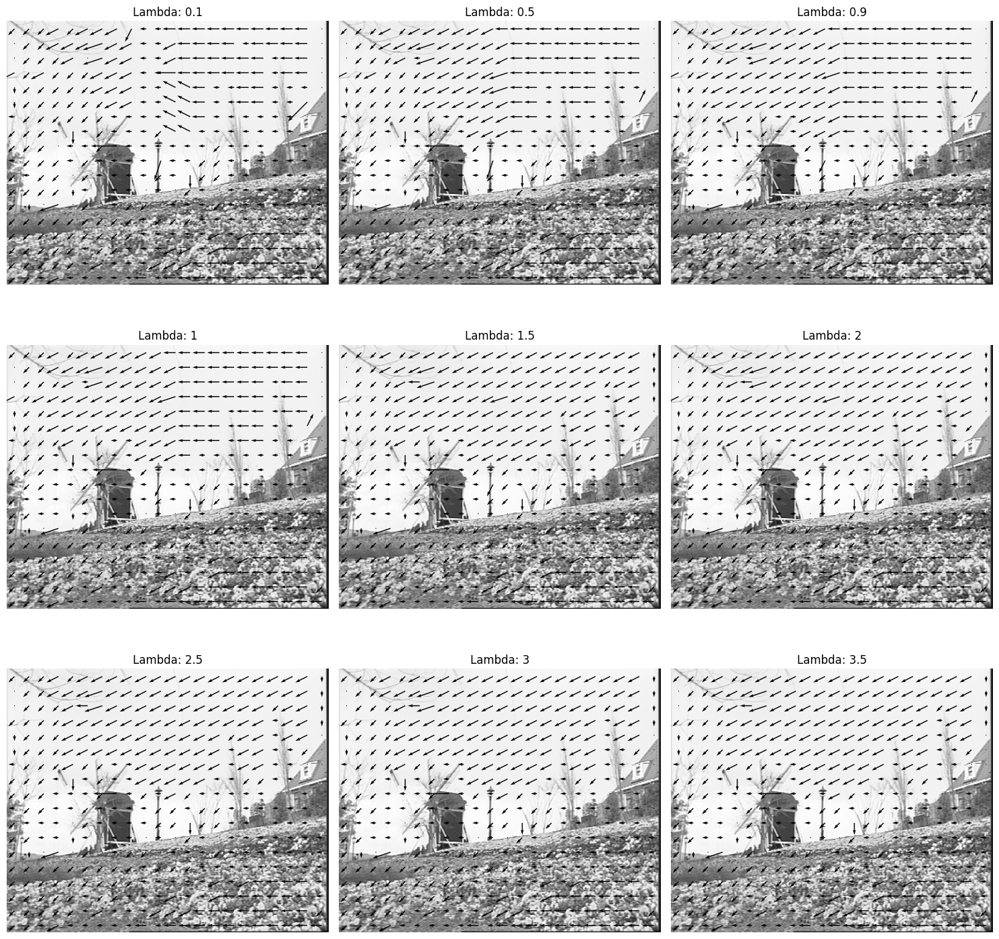

In [66]:
lambda_possible_values = [0.1, 0.5, 0.9, 1, 1.5, 2, 2.5, 3, 3.5]
fig, axs = plt.subplots(len(lambda_possible_values)//3, 3, figsize=(15, 15))

row, col = np.shape(im1)
mvf_ssds = []
for i, lamb in enumerate(lambda_possible_values):
	mvf_ssd, prediction = me_ssd(im2, im1, brow, bcol, search_radius, lamb)
	mvf_ssds.append(mvf_ssd)
	vectRow = mvf_ssd[0:row:brow, 0:col:brow, 0]
	vectCol = mvf_ssd[0:row:brow, 0:col:brow, 1]

	# Determine vector origins
	X, Y = np.meshgrid(np.arange(0, im1.shape[1], brow), np.arange(0, im1.shape[0], brow))
	X = X + np.floor(brow / 2.)
	Y = Y + np.floor(brow / 2.)

	# Show image
	axs[i // 3, i % 3].imshow(im1, cmap='gray')
	axs[i // 3, i % 3].quiver(X, Y, vectCol, -vectRow)
	axs[i // 3, i % 3].set_title(f"Lambda: {lamb}")
	axs[i // 3, i % 3].axis('off')

plt.tight_layout()
plt.show()


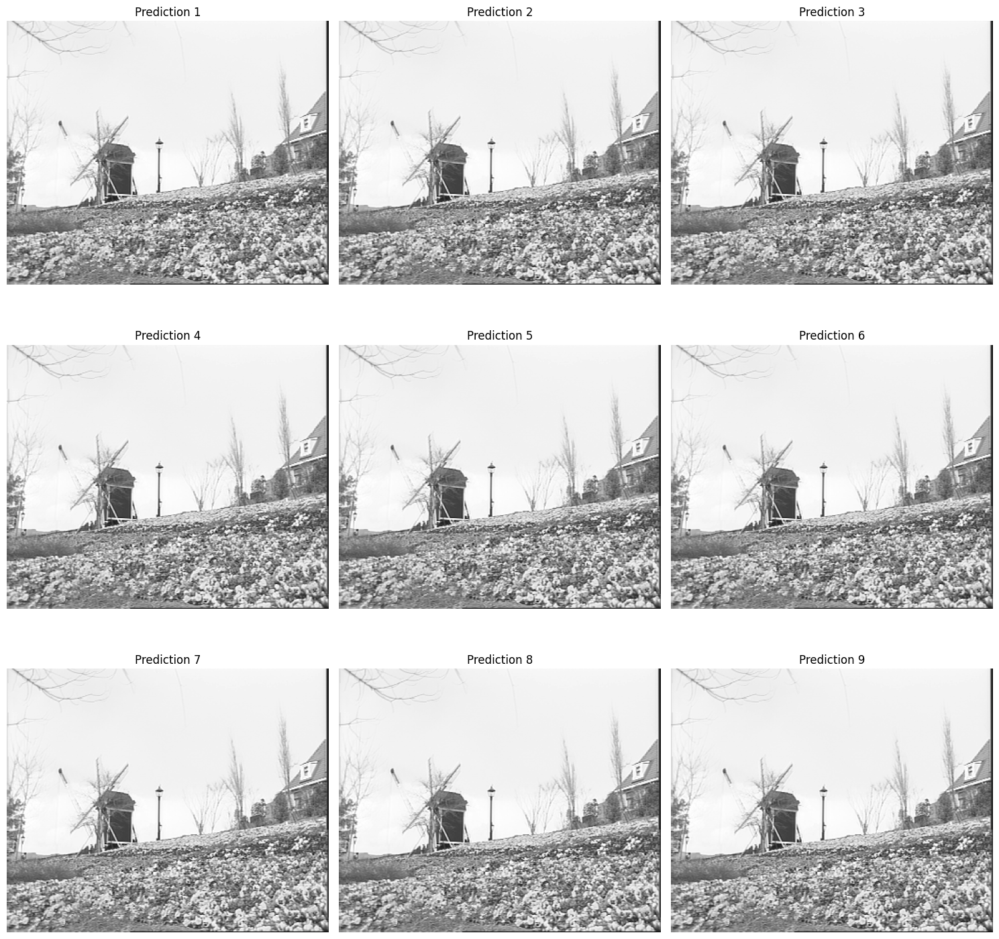

In [67]:
#mc_ssd = fracMc(im1,mvf_ssd)
#plt.figure(),plt.imshow(mc_ssd,cmap='gray')
plt.figure(figsize=(15, 15))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(fracMc(im1,mvf_ssds[i]), cmap='gray')
    plt.title(f"Prediction {i+1}")
    plt.axis('off')
plt.tight_layout()
plt.show()

How does it work and what it computes?

For each block in the current image (cur), the function computes a predictor vector pV using the computePredictor function. This predictor is essentially the median of motion vectors from neighboring blocks.
During the motion estimation process, the function considers not only the similarity between the current block and candidate blocks in the reference frame (ref) but also the deviation of the candidate motion vector from the predicted motion vector (pV).


What can be observed for different parameter values?

For the different lambsa values we can observe that it controls the smoothnes of the solution, the bigger the lambda value, the smaller the the changes in the solution since the bigger the lambda value the bigger the importance to how big/complex is the solution, ensuring that the gradient of the motion vector field takes small values. We can see that it improves the solution as we can appreciate it on the top of the lamp

### I-2-2- Regularized SAD-based algorithm

TO DO : code the regularized SAD-based algorithm.

Try several parameter values, and compare your results with the unregularized algorithms and the regularized SSD-based algorithm.

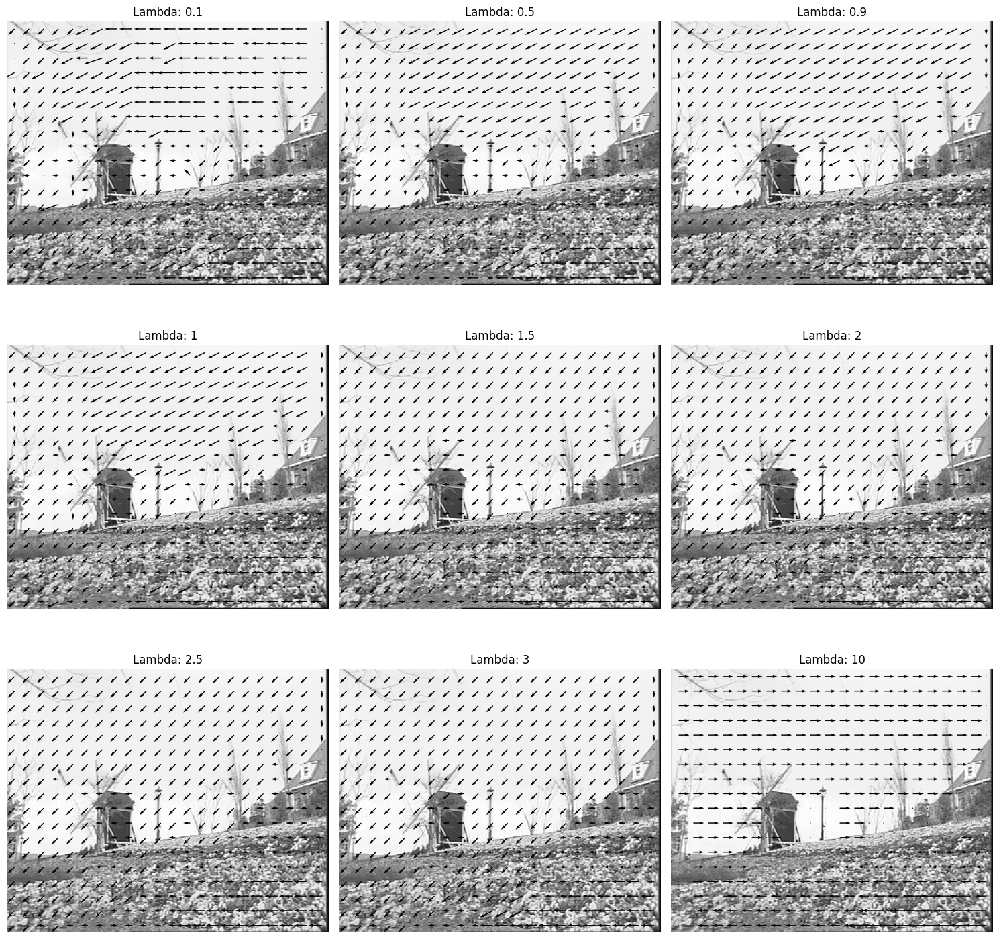

In [68]:
#mvf_sad,prediction =  me_sad(im2, im1, brow, bcol, search_radius, 1)
#displayMVF(im1,mvf_sad,brow)
lambda_possible_values = [0.1, 0.5, 0.9, 1, 1.5, 2, 2.5, 3, 10]
fig, axs = plt.subplots(len(lambda_possible_values)//3, 3, figsize=(15, 15))

row, col = np.shape(im1)
mvf_sads = []
for i, lamb in enumerate(lambda_possible_values):
	mvf_sad, prediction = me_sad(im2, im1, brow, bcol, search_radius, lamb)
	mvf_sads.append(mvf_sad)
	vectRow = mvf_sad[0:row:brow, 0:col:brow, 0]
	vectCol = mvf_sad[0:row:brow, 0:col:brow, 1]

	# Determine vector origins
	X, Y = np.meshgrid(np.arange(0, im1.shape[1], brow), np.arange(0, im1.shape[0], brow))
	X = X + np.floor(brow / 2.)
	Y = Y + np.floor(brow / 2.)

	# Show image
	axs[i // 3, i % 3].imshow(im1, cmap='gray')
	axs[i // 3, i % 3].quiver(X, Y, vectCol, -vectRow)
	axs[i // 3, i % 3].set_title(f"Lambda: {lamb}")
	axs[i // 3, i % 3].axis('off')

plt.tight_layout()
plt.show()


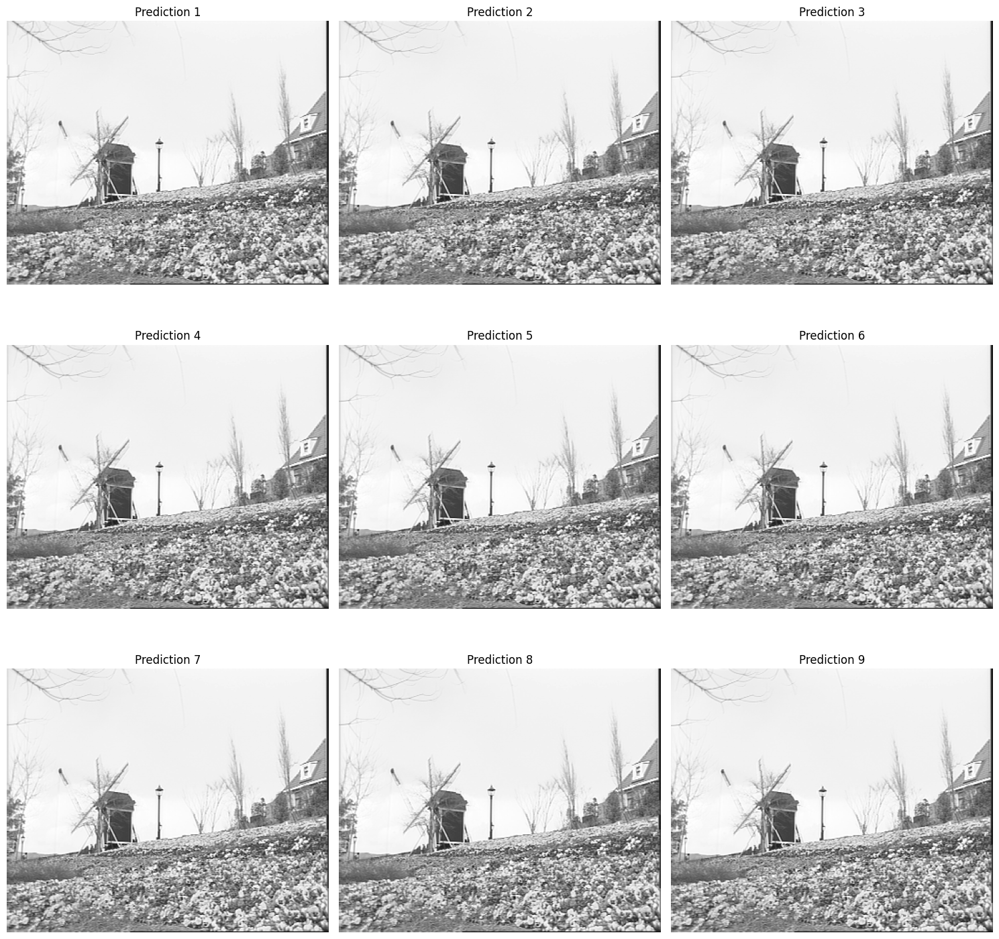

In [69]:
#mc_sad = fracMc(im1,mvf_sad)
#plt.figure(),plt.imshow(mc_sad,cmap='gray')
plt.figure(figsize=(15, 15))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(fracMc(im1,mvf_sads[i]), cmap='gray')
    plt.title(f"Prediction {i+1}")
    plt.axis('off')
plt.tight_layout()
plt.show()

That enhancement is better as we can see that the errors in the mill sails and the right tree's branches that we remarked before are now corrected, more similar now to the SSD regularized approach. Nevertheless, when the regularization parameter is too large, we lose valuable information about motion, resulting in a motion vector field (MVF) that lacks diversity and usefulness

For a given lamb value, the impact of the regularization term differs between SAD and SSD. This is because the regularization term has a greater influence in SAD compared to SSD. Since the data-attachment term in SSD is comparatively larger than that in SAD.

# Optical flow

You will now implement the Horn and Schunck algorithm to estimate the optic flow. The two images we will consider here have a more local movement vector field, since we are considering small movements in a face.

In [70]:
im1 = loadmat('akiyo_cif1.mat')['im1']
im1 = im1.astype('float')
im2 = loadmat('akiyo_cif2.mat')['im2']
im2 = im2.astype('float')

(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x1e14f116eb0>)

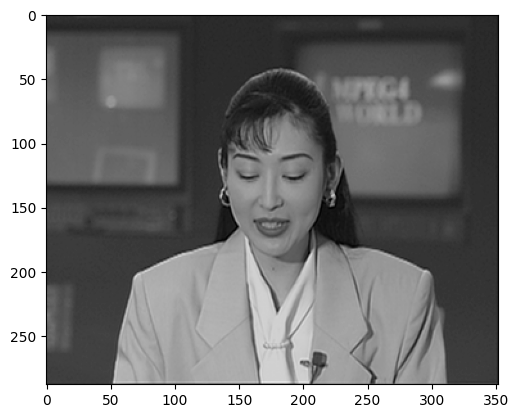

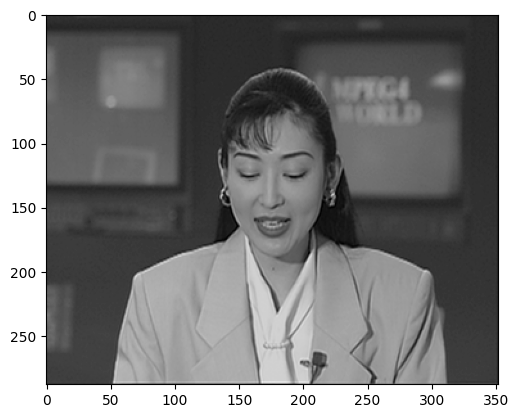

In [71]:
plt.figure(),plt.imshow(im1,cmap='gray')
plt.figure(),plt.imshow(im2,cmap='gray')

Compute the optical flow by filling the gaps in the Horn and Schunck function. You can use the motion field that you estimated before with the block matching algorithm to initialize the Horn and Schunck method.

As a reminder, the optical flow is implemented by the iterative Horn and Schunck's algorithm:
$$
u^{n+1} = \bar{u}^n - f_x \frac{\bar{u}^n f_x + \bar{v}^n f_y + f_t}{\alpha^2 + \|\nabla f\|^2}
$$
$$
v^{n+1} = \bar{v}^n - f_y \frac{\bar{u}^n f_x + \bar{v}^n f_y + f_t}{\alpha^2 + \|\nabla f\|^2}
$$
where $u^n$ is the value of the $u$ component at the $n$-th iteration, and $\bar{u}$ is the local average of $u$.

In [72]:
brow = 16; bcol=16; search_radius =13;

...



Ellipsis

In [73]:
def computeDerivatives(im1, im2):
    kernel1D = np.expand_dims((1./12.)*np.array([-1., 8., 0., -8., 1.]),axis=1).T
    fx = convolve2d(im1,kernel1D,'same')
    fy = convolve2d(im1,kernel1D.T,'same')
    ft = convolve2d(im1, 0.25*np.ones((2,2)),'same') + convolve2d(im2, -0.25*np.ones((2,2)),'same');
    fx =-fx;
    fy=-fy;

    return fx, fy, ft


def HS(im1, im2, uInitial, vInitial, alpha=1, ite=100, blur=1.):
    """
    Horn-Schunck optical flow method.
    Horn, B.K.P., and Schunck, B.G., Determining Optical Flow, AI(17), No. 1-3, August 1981, pp. 185-203 http://dspace.mit.edu/handle/1721.1/6337
    
    [u, v] = HS(im1, im2, alpha, ite, uInitial, vInitial, displayFlow)
    
    Parameters
    ----------
    im1, im2 : np.array
        Two subsequent frames or images.
    uInitial, vInitial: np.array
        Initial values for the (u,v) flow. If well initialized, the flow would converge faster and hence would need less iterations.
    alpha : scalar
        A parameter that reflects the influence of the smoothness term.
    ite : int
        Number of iterations.

    Returns
    -------
    u,v : np.array
        Optical flow.
    """
    
    im1 = gaussian_filter(im1, blur)
    im2 = gaussian_filter(im2, blur)
    
    # Set initial value for the flow vectors
    u = uInitial.copy()
    v = vInitial.copy()
    
    # Estimate spatiotemporal derivatives
    fx, fy, ft = computeDerivatives(im1, im2)
    
    # Averaging kernel
    kernel_1 = np.array([[1./12., 1./6., 1./12.], [1./6., 0., 1./6.], [1./12., 1./6., 1./12.]])
    
    for i in range(ite):
        # Compute local averages of the flow vectors using kernel_1
        uAvg = convolve2d(u, kernel_1, 'same')
        vAvg = convolve2d(v, kernel_1, 'same')
        
        # Compute flow vectors constrained by its local average and the optical flow constraints
        u = uAvg - (fx * (fx * uAvg + fy * vAvg + ft)) / (alpha**2 + fx**2 + fy**2)
        v = vAvg - (fy * (fx * uAvg + fy * vAvg + ft)) / (alpha**2 + fx**2 + fy**2)
        
    u[np.isnan(u)] = 0
    v[np.isnan(v)] = 0
    return u, v

In [74]:
alpha = 100
ite = 100

# Rem: pay attention to the inversion of the order compare to me_ssd.
mvf_sad, _ = me_sad(im2, im1, brow, bcol, search_radius, lamb=0.1)

# Rem: pay attention to the inversion of the order compare to me_ssd.
uInitial = mvf_sad[:, :, 1]
vInitial = mvf_sad[:, :, 0]


[u, v] = HS(im2, im1, uInitial, vInitial, alpha, ite,blur=1.)

Display the motion field and compute the PSNR. Do you observe any improvement compare to block-matching algorithms? Explain. You can test on both the Akiyo and Flowers images.

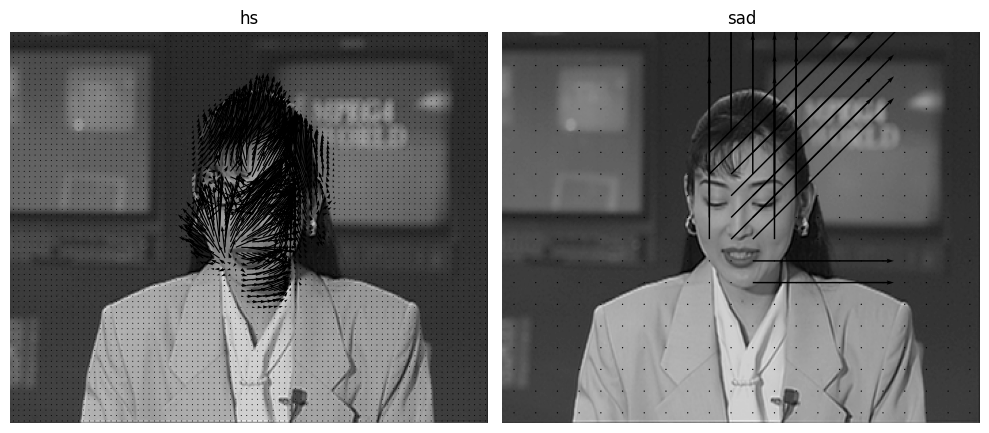

In [75]:
mvf_hs = np.zeros((np.shape(v)[0],np.shape(v)[1],2))
mvf_hs[:,:,0] = v
mvf_hs[:,:,1] = u
#displayMVF(im1,mvf_hs,4)
###
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

row, col = np.shape(im1)
for i in range(2):
	if i == 0:
		mvf = mvf_hs
		subsamp =  4
	else:
		mvf = mvf_sad
		subsamp =  16

	vectRow = mvf[0:row:subsamp, 0:col:subsamp, 0]
	vectCol = mvf[0:row:subsamp, 0:col:subsamp, 1]

	# Determine vector origins
	X, Y = np.meshgrid(np.arange(0, im1.shape[1], subsamp), np.arange(0, im1.shape[0], subsamp))
	X = X + np.floor(subsamp / 2.)
	Y = Y + np.floor(subsamp / 2.)

	# Show image
	axs[i].imshow(im1, cmap='gray')

	axs[i].quiver(X, Y, vectCol, -vectRow)
	if i == 0:
		axs[i].set_title(f"hs")
	else:
		axs[i].set_title(f"sad")
	axs[i].axis('off')

plt.tight_layout()
plt.show()


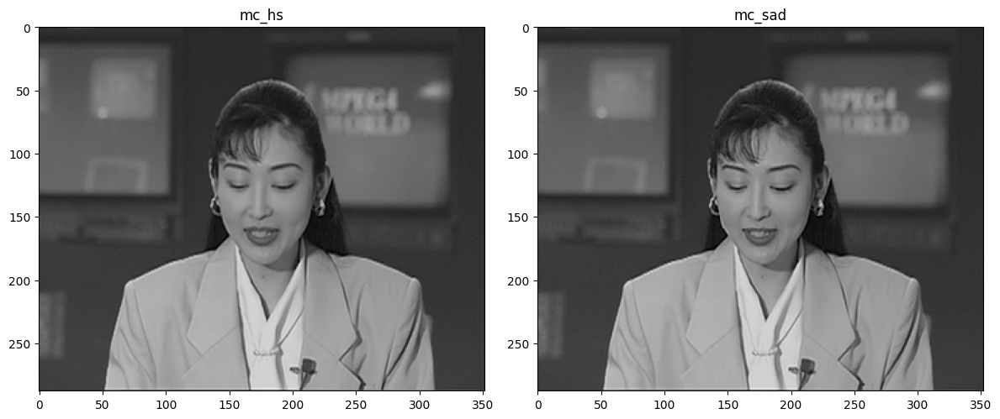

In [76]:
mc_hs = fracMc(im1,mvf_hs)
mc_sad = fracMc(im1,mvf_sad)
# Plot mc_sad
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(mc_hs, cmap='gray')
plt.title('mc_hs')

# Plot mc_ssd
plt.subplot(1, 2, 2)
plt.imshow(mc_sad, cmap='gray')
plt.title('mc_sad')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()



In [77]:
psnr_hs = PSNR(im2,mc_hs)
psnr_sad = PSNR(im2,mc_sad)
print(f'PSNR for hs and im2 = {psnr_hs:.2f} dB')
print(f'PSNR for sad and im2 = {psnr_sad:.2f} dB')

PSNR for hs and im2 = 35.74 dB
PSNR for sad and im2 = 31.72 dB


We can appreaciate that definitely there is improvement comparing to block-matching algorithms

Taking a look at the movement vector fields:

We can see that there is more detail in the hs approach since the vectors are defined more locally and in better directions comparing to the block-matching algorithms

Taking a look at the PSNR value:

We can see that the PSNR value for hs and im2 is bigger than the one given by comparing sad and im2. This means tht the hs image is better, more accurate than the block-matching algorithms. All of this because HS method performs a global optimization to estimate the motion field. It considers the entire image or a large region for motion estimation rather than relying on local blocks. This global approach helps in capturing complex motion patterns, including local changes.